## Проектная работа

# Рынок заведений общественного питания Москвы

## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Описание данных

Файл moscow_places.csv:

- name — название заведения

- address — адрес заведения;

- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

- hours — информация о днях и часах работы;

- lat — широта географической точки, в которой находится заведение;

- lng — долгота географической точки, в которой находится заведение;

- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

- district — административный район, в котором находится заведение, например Центральный административный округ;

- seats — количество посадочных мест.

## Загрузка данных и изучение общей информации

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
from plotly import graph_objects as go 
import plotly.express as px


import warnings
warnings.filterwarnings("ignore")

In [6]:
data = pd.read_csv('C:\\Users\\77281\\Downloads\\moscow_places.csv')
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Изучим общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят? 

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датафрейме представлены сведения о 8406 заведениях общественного питания Москвы. 

Столбцы 'name', 'category', 'address', 'district', 'hours', 'price' и 'avg_bill' хранят данные типа object и содержат информацию соответственно о названии, категории, адресе, районе, днях и часах работы, категории цен и средней стоимости заказа. 

Столбцы 'lat' и 'lng' содержат данные о географических координатах заведения в виде данных типа float. 

Столбцы 'middle_avg_bill' и 'middle_coffee_cup' содержат данные о среднем чеке и средней стоимости чашки капучино в виде данных типа float. 

Столбец 'chain' хранит целые значения 1 и 0, означающие, является ли заведение сетевым или нет. 

Столбец 'seats' содержит данные о количестве посадочных мест в виде данных типа float. 

В некоторых столбцах имеются пропуски.

## Предобработка данных 

###  Проверка на дубликаты 

Проверка на наличие явных дубликатов:

In [14]:
print(data.duplicated().sum())

0


Явных дубликатов не обнаружено

Проверка на наличие явных дубликатов по сочетанию названия и адреса:

In [15]:
data.duplicated(subset=['name', 'address']).sum()

0

Явных дубликатов по сочетанию названия и адреса не обнаружено.

Проверка на наличие неявных дубликатов в категориях заведения:

In [16]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Неявных дубликатов в категориях заведения не выявлено

Проверка на наличие неявных дубликатов в названиях районов:

In [17]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Неявных дубликатов в названиях районов не выявлено.

Посмотрим количество заведений по названиям:

In [18]:
data.groupby('name').agg(count=('name', 'count')).sort_values(by='count', ascending=False).reset_index().head(30)

,name,count
0,Кафе,189
1,Шоколадница,120
2,Домино'с Пицца,76
3,Додо Пицца,74
4,One Price Coffee,71
5,Яндекс Лавка,69
6,Cofix,65
7,Prime,50
8,Хинкальная,44
9,Шаурма,43


По названияв выявили, что большая часть этих заведний - сетевые. Но так же встречаются заведения с общими названиями "Кафе","Шаурма", "Ресторан" и "Столовая". Проверим, есть ли среди заведений с такими названиями сетевые.

In [19]:
data.query('(name == "Кафе" or name == "Шаурма" or  name == "Ресторан" or name == "Столовая") and chain == 1')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Сетевых нет. Необходимо проверить данные на неявные дубликаты по названиям.

Выведем в отдельный столбец первое слово названия заведения:

In [20]:
data['first_name'] = data['name'].str.split(' ').str[0]
data.duplicated(subset=['first_name', 'category', 'address']).sum()

16

Выявлено 16 неявных дубликатов.

Выведем и изучим информацию о дубликатах:

In [21]:
data.loc[data.duplicated(subset=['first_name', 'category', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,first_name
20,Чебуреки Манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0,Чебуреки
55,Чебуреки и манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880288,37.448645,4.3,NaN,NaN,NaN,NaN,0,148.0,Чебуреки
416,Чайхана Халал,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860894,37.482553,4.3,NaN,NaN,NaN,NaN,0,53.0,Чайхана
450,Чайхана Халаль,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860892,37.482538,4.3,NaN,NaN,NaN,NaN,1,53.0,Чайхана
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,More
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,More
1642,Кафе для поминок,кафе,"Москва, улица Верхняя Масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.793295,37.565569,4.9,NaN,NaN,NaN,NaN,0,50.0,Кафе
1671,Кафе ЗамоК,кафе,"Москва, улица Верхняя Масловка, 10, стр. 4",Северный административный округ,"ежедневно, 10:00–00:00",55.793331,37.565588,4.2,средние,Средний счёт:700–1000 ₽,850.0,NaN,0,50.0,Кафе
2384,Хлеб Насущный,булочная,"Москва, Комсомольская площадь, 3",Центральный административный округ,"ежедневно, круглосуточно",55.776529,37.655238,4.1,NaN,NaN,NaN,NaN,1,200.0,Хлеб
2467,Хлеб Насущный Экспресс,булочная,"Москва, Комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.779720,37.654411,4.1,NaN,NaN,NaN,NaN,0,200.0,Хлеб


У этих заведений различаются написания названий, например 'Чебуреки Манты' или 'Чебуреки и манты' , но совпадают категории и адреса. Удалим строки, которые по всей видимости являются дубликатами:

In [22]:
# удаляем строки-дубликаты
data = data.drop(data[(data['name'] == "Чебуреки Манты") & (data['address'] == "Москва, Правобережная улица, 1Б")].index)
data = data.drop(data[(data['name'] == "Чайхана Халал") & (data['address'] == "Москва, Смольная улица, 24Г, стр. 6")].index)
data = data.drop(data[(data['name'] == "More poke") & (data['address'] == "Москва, Волоколамское шоссе, 11, стр. 2")].index)
data = data.drop(data[(data['name'] == "Кафе для поминок") & (data['address'] == "Москва, улица Верхняя Масловка, 10, стр. 4")].index)
data = data.drop(data[(data['name'] == "Хлеб Насущный Экспресс") & (data['address'] == "Москва, Комсомольская площадь, 3")].index)
data = data.drop(data[(data['name'] == "Dragon bubble tea") & (data['address'] == "Москва, Щёлковское шоссе, вл75")].index)
data = data.drop(data[(data['name'] == "Царская кофейня") & (data['address'] == "Москва, Измайловское шоссе, 73Ж")].index)
data = data.drop(data[(data['name'] == "Баку 24 часа") & (data['address'] == "Москва, Монтажная улица, 9, стр. 1")].index)
data = data.drop(data[(data['name'] == "Udcкафе Upside Down Cake")  & (data['address'] == "Москва, Кутузовский проспект, 57")].index)
data = data.drop(data[(data['name'] == "VIP Wok and sushi") & (data['address'] == "Москва, Можайское шоссе, 45Б")].index)
data = data.drop(data[(data['name'] == "Чайхана Азия") & (data['address'] == "Москва, Большая Очаковская улица, 47А, стр. 1") ].index)
data = data.drop(data[(data['name'] == "Хинкальная экспресс") & (data['address'] == "Москва, Тихорецкий бульвар, 1, стр. 6")].index)
data = data.drop(data[(data['name'] == "Хинкальная Экспресс") & (data['address'] == "Москва, МКАД, 14-й километр, 2, стр. 1")].index)
data = data.drop(data[(data['name'] == "Estetica") & (data['address'] == "Москва, Кировоградская улица, 15")].index)
data = data.drop(data[(data['name'] == "Кафе в Зимнем саду")& (data['address'] == "Москва, Ореховый бульвар, 28")].index)
data = data.drop(data[(data['name'] == "От и ДО")& (data['address'] == "Москва, улица Вавилова, 64/1с1")].index)

In [23]:
data['first_name'] = data['name'].str.split(' ').str[0]
data.duplicated(subset=['first_name', 'category', 'address']).sum()

0

Неявные дубликаты удалены.

Удалим столбец с первым словом названия заведения:

In [24]:
data = data.drop(['first_name'], axis=1)

In [25]:
print('Удалено', 8406 - len(data), 'дубликатов. Теперь в датасете', len(data), 'заведений.' )

Удалено 16 дубликатов. Теперь в датасете 8390 заведений.


### Обработка пропусков в данных 

Посмотрим на количество на пропусков по столбцам:

In [26]:
print(data.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5075
avg_bill             4574
middle_avg_bill      5241
middle_coffee_cup    7855
chain                   0
seats                3606
dtype: int64


Переведем количество пропусков в проценты:

In [27]:
pd.DataFrame(round(data.isna().mean()*100))

,0
name,0.0
category,0.0
address,0.0
district,0.0
hours,6.0
lat,0.0
lng,0.0
rating,0.0
price,60.0
avg_bill,55.0


- Наибольшее количество пропусков - в столбце middle_coffee_cup (94 %). 
- Больше половины данных составляют пропуски в столбцах middle_avg_bill, price и avg_bill, меньше половины - в столбце seats. 
- Немного пропусков (6 %) содержит столбец hours.

*Вывод:*

Выявили множественные пропуски. К сожалению, обработать большую часть их них невозможно из-за отсутствия статистики. 
Заполнять пропуски средними или медианными значениями некорректно, так как даже для сетевых заведений данные в разных районах могут значительно отличаться.
Чтобы избежать искажения данных, оставим пропуски как есть.

###  Добавление столбцов

Создим столбец 'street' с названиями улиц из столбца с адресом:

In [28]:
data['street'] = data['address'].str.split(', ').str[1]

# альтернативный способ
#data['street'] = data['address'].apply(lambda x: x.split(sep=', ')[1])

Создадим столбец 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [29]:
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'      
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


## 3. Анализ данных 

### Исследование данных по категориям заведений

Посмотрим, какие категории заведений представлены в данных? Посчитаем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее:

In [31]:
 categories = data.groupby('category').agg(count=('category', 'count')).sort_values(by='count', ascending=False).reset_index()
categories

,category,count
0,кафе,2371
1,ресторан,2040
2,кофейня,1411
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,600
6,столовая,315
7,булочная,255


Выведем полученные данные в виде барчарта:

In [32]:
fig = px.bar(categories,
             x='category', 
             y='count', 
             text='count',
             title='Количество объектов общественного питания по видам'
            )
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show() 

In [33]:
go.Figure(data=[go.Pie(labels=categories['category'], values=categories['count'])], 
          layout=go.Layout(title=go.layout.Title(text='Количество объектов общественного питания Москвы по категориям')))

###### Вывод: 

По количеству заведений лидируют кафе с численностью 2371 (28,3%), немного меньше ресторан - 2040 (24,3%). На третьем месте расположены кофейни - 1411 (16,8%). Меньше всего заведений в категориях столовая - 315 (3,15%) и булочная - 255 (3,04%).

Кафе и рестораны составляют больше половины от всех заведений. Кофейни, бары/пабы и пиццерии составляют больше трети от общего числа заведений. Оставшаяся доля (чуть меньше 14%) приходится на булочные, столовые и заведения быстрого питания.


### Исследование количества посадочных мест по категориям заведений 

Сделаем группировку количества посадочных мест по категориям:

In [34]:
data.groupby('category')['seats'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",468.0,124.53,145.01,0.0,48.0,82.5,150.00,1288.0
булочная,147.0,88.63,97.59,0.0,25.0,50.0,120.00,625.0
быстрое питание,348.0,99.13,106.67,0.0,29.5,67.0,140.75,1040.0
кафе,1212.0,97.54,118.19,0.0,35.0,60.0,120.00,1288.0
кофейня,750.0,111.22,127.92,0.0,40.0,80.0,144.00,1288.0
пиццерия,427.0,94.50,112.28,0.0,30.0,55.0,120.00,1288.0
ресторан,1268.0,121.95,123.83,0.0,48.0,86.0,150.00,1288.0
столовая,164.0,99.75,122.95,0.0,40.0,75.5,117.00,1200.0


Визуализируем распределение среднего количества мест по категориям:

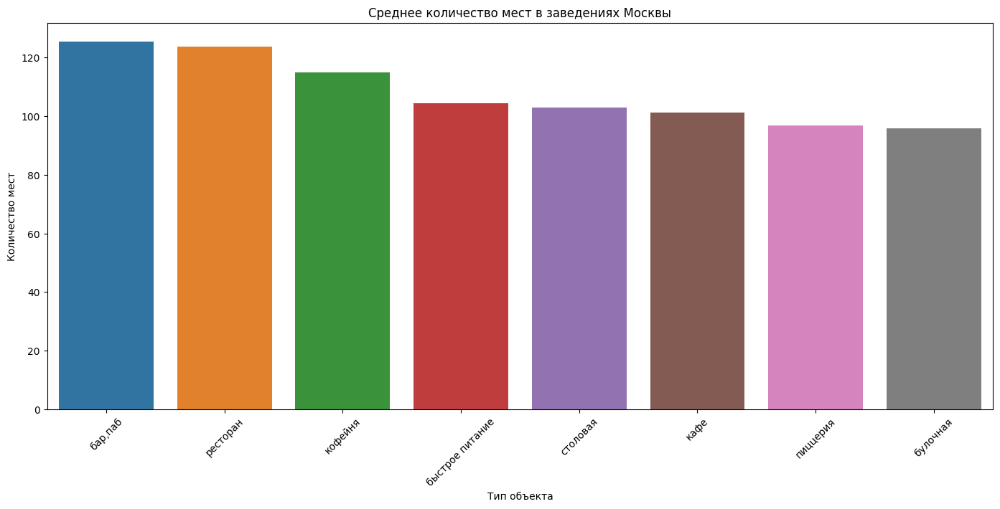

In [35]:
mean_seats = data[data['seats'] != 0].groupby('category')['seats'].mean().reset_index().sort_values(by='seats', ascending=False).round(2)

f, ax = plt.subplots(figsize=(17, 7))

ax = sns.barplot(data=mean_seats, x='category', y='seats')

ax.set_xlabel('Тип объекта')
ax.set_ylabel('Количество мест')
ax.set_title('Среднее количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()



Вычисленим медиану для каждой категории, отсортируем список категорий по возрастанию медианы, построим 'ящик с усами' и посмотрим на наличие выбросов в данных:

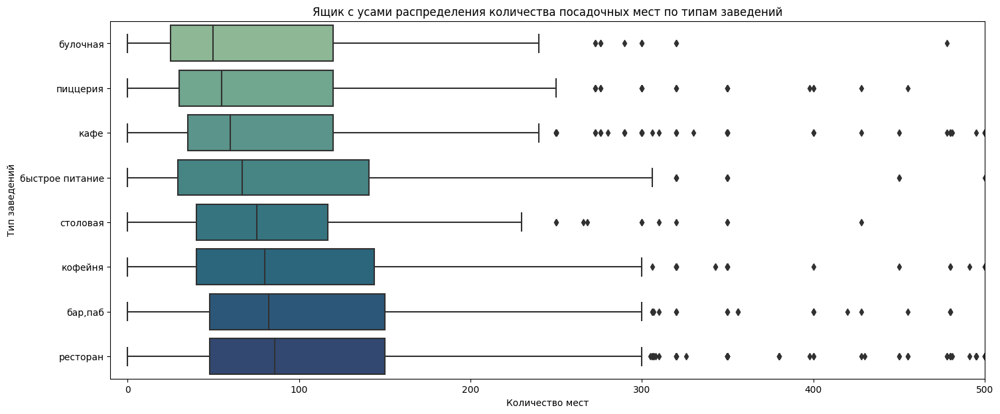

In [42]:
medians = data.groupby('category')['seats'].median()

sorted_categories = medians.sort_values().index

plt.figure(figsize=(17, 7))
ax = sns.boxplot(x=data['seats'], y=data['category'], orient='h', order = sorted_categories, palette="crest")
ax.set_xlim(-10,500)
plt.title('Ящик с усами распределения количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.show()

Во избежание влияния выбросов на распределение среднего количества мест по категориям лучше воспользуемся медианой:

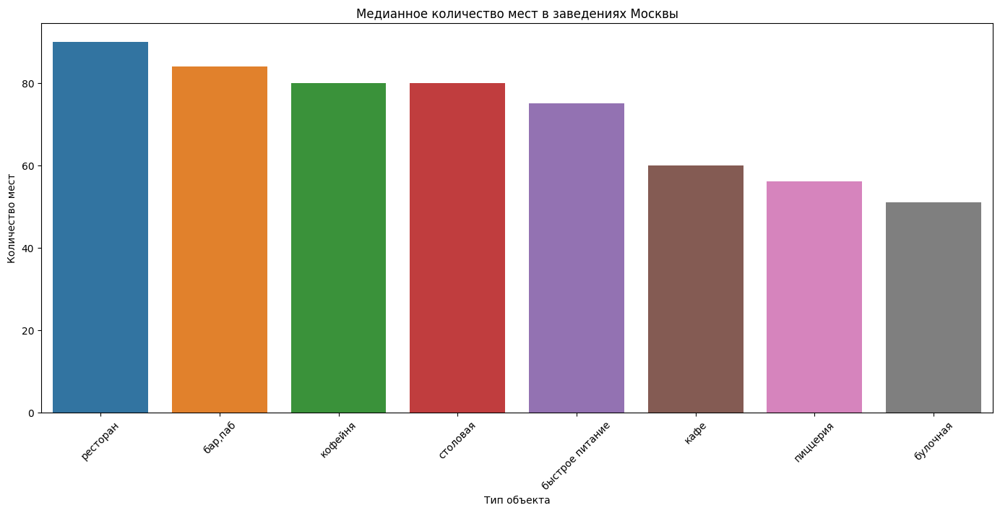

In [43]:
median_seats = data[data['seats'] != 0].groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False).round(2)

f, ax = plt.subplots(figsize=(17, 7))

ax = sns.barplot(data=median_seats, x='category', y='seats')

ax.set_xlabel('Тип объекта')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()

In [44]:
data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False).round(2)

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,67.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


Наибольшее медианное количество посадочных мест - в ресторанах (86), барах и пабах (82,5) и кофейнях (80). Меньше посадочных мест в столовых (75), в заведениях быстрого питания (67). Меньше всего посадочных мест в кафе (60), в пиццериях (55) и в булочных (50).

### Исследование соотношения сетевых и несетевых заведений.

Подсчитаем число сетевых и несетевых заведений:

In [45]:
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5188
1,1,3202


Визуализируем распределения сетевых и несетевых заведений общественного питания в виде круговой диаграммы:

In [46]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

Большая часть заведений общественного питаБния в Москве - несетевые (62 %), сетевых заведений 38 %.

### Какие категории заведений чаще являются сетевыми?

Посчитаем, сколько сетевых и несетевых заведений в каждой категории:

In [47]:
chain_objects = data.groupby(['category', 'chain'])['name'].count().reset_index()
chain_objects.columns = ['object_type',
                          'chain', 'count']
chain_objects['chain'] = chain_objects['chain'].astype(object)
chain_objects = chain_objects.sort_values(['count', 'chain'])
print(chain_objects)

        object_type chain  count
15         столовая     1     88
2          булочная     0     98
3          булочная     1    157
1           бар,паб     1    169
14         столовая     0    227
5   быстрое питание     1    231
10         пиццерия     0    303
11         пиццерия     1    330
4   быстрое питание     0    369
0           бар,паб     0    596
8           кофейня     0    691
9           кофейня     1    720
13         ресторан     1    730
7              кафе     1    777
12         ресторан     0   1310
6              кафе     0   1594


In [48]:
fig = px.bar(chain_objects,
             x='count', 
             y='object_type',
             text='count',
             color='chain',
             category_orders={"chain": ["сетевой", "несетевой"]}
            )

fig.update_layout(title='Соотношение сетевых и несетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название категорий'
                 )
fig.show()

In [49]:
pd.pivot_table(data, values='name', index='category', columns='chain', aggfunc='count')

chain,0,1
category,,
"бар,паб",596,169
булочная,98,157
быстрое питание,369,231
кафе,1594,777
кофейня,691,720
пиццерия,303,330
ресторан,1310,730
столовая,227,88


Сохраним получившиеся значения в новый датафрейм и отсортируем значения по убыванию количества несетевых заведений:

In [50]:
chain_pivot = pd.pivot_table(
    data, values='name', index='category', columns='chain', aggfunc='count').reset_index().sort_values(
    by=0, ascending=True)
chain_pivot

chain,category,0,1
1,булочная,98,157
7,столовая,227,88
5,пиццерия,303,330
2,быстрое питание,369,231
0,"бар,паб",596,169
4,кофейня,691,720
6,ресторан,1310,730
3,кафе,1594,777


Добавим столбец долей сетевых заведений от общего числа заведений в одном объекте общественного питания:

In [52]:
chain_pivot['chain_share'] = (chain_pivot[1] / (chain_pivot[1] + chain_pivot[0])).map('{:,.2}'.format)
chain_pivot = chain_pivot.sort_values(by='chain_share')
chain_pivot

chain,category,0,1,chain_share
0,"бар,паб",596,169,0.22
7,столовая,227,88,0.28
3,кафе,1594,777,0.33
6,ресторан,1310,730,0.36
2,быстрое питание,369,231,0.39
4,кофейня,691,720,0.51
5,пиццерия,303,330,0.52
1,булочная,98,157,0.62


Выведем полученные данные в виде барчарта:

In [55]:
fig = px.bar(chain_pivot,
             x='category', 
             y='chain_share', 
             text='chain_share',
             title='Доля сетевых заведений в общем числе заведений общественного питания по категориям'
            )
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Доля сетевых заведений'
                 )
fig.show() 

###### Вывод:

Самая большая доля сетевых объектов среди булочных (62%).
Затем идут пиццерии (52%), кофейни (51%) и фаст-фуд (39%).

### Найдем топ-15 заведений в Москве

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Знакомы ли нам эти сети? Определим, есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [56]:
data_chain = data[data['chain'] == 1]
top_15_chain = data_chain.groupby('name').agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15_chain = top_15_chain.rename(columns={'district':'count'})
top_15_chain = top_15_chain.sort_values('count', ascending = False).reset_index().head(15)
top_15_chain

,name,rating,category,count
0,Шоколадница,4.20,кофейня,120
1,Домино'с Пицца,4.20,пиццерия,76
2,Додо Пицца,4.30,пиццерия,74
3,One Price Coffee,4.20,кофейня,71
4,Яндекс Лавка,4.00,ресторан,69
5,Cofix,4.10,кофейня,65
6,Prime,4.20,ресторан,50
7,Хинкальная,4.40,кафе,44
8,КОФЕПОРТ,4.20,кофейня,42
9,Кулинарная лавка братьев Караваевых,4.40,кафе,39


Для визуализации построим столбчатую диаграмму:

In [57]:
fig = px.bar(top_15_chain,
             x='count', 
             y='name', 
             text='count',
             color='name'
            )

fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведений',
                   showlegend=False
                 ) 
              
fig.show() 

*Вывод:*

Самая популярная сеть в Москве, причем с большим отрывом от конкурентов - это Шоколадница (категория "кофейня"), она имеет 120 заведений. Далее расположены Домино'с Пицца (категория "пиццерия") - 76 заведений и Додо Пицца (категория "пиццерия") - 74 заведения. Все три сети расчитаны на клиента среднего уровня, где Шоколадница занимает более высокий ценовой сегмент, а Домино'с Пицца и Додо Пицца - более дешевый, и много работают с доставкой и на вынос.

### Изучим, какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. Проиллюстрируем эту информацию одним графиком.

In [58]:
print('Всего заведений в датасете:', len(data))

Всего заведений в датасете: 8390


Сгруппируем данные по району и категории, чтобы посчитать количество заведений каждой категории по районам:

In [59]:
district = data.groupby(['district', 'category']).agg({'rating' : 'mean', 'address' : 'count'})
district = district.sort_values('rating', ascending = False).reset_index()
district = district.rename(columns={'address':'count'})
district

,district,category,rating,count
0,Центральный административный округ,"бар,паб",4.486264,364
1,Центральный административный округ,ресторан,4.416119,670
2,Центральный административный округ,пиццерия,4.411504,113
3,Западный административный округ,"бар,паб",4.398000,50
4,Северо-Западный административный округ,"бар,паб",4.391304,23
...,...,...,...,...
67,Северо-Восточный административный округ,быстрое питание,4.032927,82
68,Северный административный округ,быстрое питание,3.975862,58
69,Западный административный округ,быстрое питание,3.965574,61
70,Северо-Западный административный округ,быстрое питание,3.950000,30


In [60]:
print('В датасете представлены следующие административные округа:', district['district'].unique())

В датасете представлены следующие административные округа: ['Центральный административный округ' 'Западный административный округ'
 'Северо-Западный административный округ'
 'Юго-Западный административный округ'
 'Северо-Восточный административный округ' 'Южный административный округ'
 'Северный административный округ' 'Восточный административный округ'
 'Юго-Восточный административный округ']


Визуализируем распределение количества заведений каждой категории по районам. Для визуализации построим столбчатую диаграмму:

In [61]:
fig = px.bar(district, 
             x='count', 
             y='district',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                 )
# выводим график
fig.show()

*Вывод:*

По количеству заведений однозначно лидирует Центральный административный округ с общим количеством заведений 2241, обходя почти в два с половиной раза соседей по рейтингу. Северный, Северо-Восточный и Южный округа занимают второе, третье и четвертое места и имеют примерно одинаковое количество заведений - чуть менее 900. 
Меньше всего заведений в Северо-Западном округе, всего 409.

###  Визуализируем распределение средних рейтингов по категориям заведений. Узнаем, сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [62]:
rating_category = data.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [63]:
fig = px.bar(rating_category,
             x='rating', 
             y='category',
             text='rating', 
             color='category'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
# меняем диапазон значений рейтинга на графике
fig.update_xaxes(range=[4, 4.5])
# выводим график
fig.show()

###### Вывод:

Самую высокую оценку посетителей (4,39) получают заведения в категории "Бар, паб". Вероятно, такая благосклонность публики связана с приемом алкоголя в этих заведениях.
Средний рейтинг имеют пиццерии(4,3), рестораны(4,29), кофейни(4,28) и булочные(4,27).
Самые низкие рейтинги у столовых(4,21), кафе(4,12) и заведений быстрого питания(4,05).

###  Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района. 

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson

In [71]:
rating = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


Подключаем модуль для работы с JSON-форматом:

In [72]:
import json

Читаем файл и сохраняем в переменной:

In [73]:
geo_json = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'  

In [74]:
# подключаем библиотеку
!pip install folium

# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

По данным видно, что самый высокий рейтинг в заведениях в Центральном административном округе - 4.38. Самый низкий в Юго-Восточном административном округе - 4.1.

### Все заведения датасета на карте.

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [75]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

###  Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Проиллюстрируем эту информацию одним графиком.

In [76]:
streets_moscow = data[data['street'].notnull()]
top15_streets = streets_moscow['street'].value_counts().reset_index().head(15)
top15_streets

,index,street
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,64


In [77]:
#создадим таблицу с названиями улиц и категорий
streets_category = data.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['index', 'category', 'count']
streets_category.sort_values('count', ascending=False)

,index,category,count
2860,проспект Мира,кафе,53
1380,МКАД,кафе,45
2863,проспект Мира,ресторан,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1530,Мосфильмовская улица,столовая,1
1531,Моховая улица,"бар,паб",1
1533,Мукомольный проезд,булочная,1
1534,Мукомольный проезд,быстрое питание,1


Оставим только улицы из топ 15:

In [78]:
top15_streets_category = streets_category[streets_category['index'].isin(top15_streets['index'])]
top15_streets_category

,index,category,count
683,Варшавское шоссе,"бар,паб",6
684,Варшавское шоссе,быстрое питание,7
685,Варшавское шоссе,кафе,18
686,Варшавское шоссе,кофейня,14
687,Варшавское шоссе,пиццерия,4
...,...,...,...
3434,улица Миклухо-Маклая,быстрое питание,4
3435,улица Миклухо-Маклая,кафе,21
3436,улица Миклухо-Маклая,кофейня,4
3437,улица Миклухо-Маклая,пиццерия,2


In [79]:
fig = px.bar(top15_streets_category,
             x='count', 
             y='index',                  
             color='category'
            )

# оформляем график
fig.update_layout(title='Количество ',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                   #font=dict(size=8),
                   #autosize=False,
                   #width=1000,
                   #height=800
                 )
# выводим график
fig.show() 

###### Вывод:

График показывает, что по количеству заведений лидирует проспект Мира. По категориям здесь преобладают кафе, рестораны и кофейни. Меньше всего столовых и булочных.
Следом за ним идет Профсоюзная, ситуация с категориями там очень похожа.
Меньше всего заведений на Пятницкой улице. Среди популярных категорий также рестораны, кафе и кофейни.

Следует отметить, что по этим данным нельзя говорить о плотности распределения заведений на какой-либо улице. Дело в том, что Проспект Мира и Профсоюзная - это самые длинные по протяженности улицы Москвы. А Пятницкая улица - гораздо короче. И хотя на Пятницкой почти в каждом доме есть кафе и рестораны, по общему количеству она не может соперничать с улицами из верхних позиций в топ 15.

### Улицы, на которых находится только один объект общепита.

Найдем улицы, на которых находится только один объект общепита. Посмотрим, что можно сказать об этих заведениях?

In [80]:
one_object_streets = data.groupby('street') \
                            .agg(count=('name', 'count')) \
                            .sort_values(by='count', ascending=False) \
                            .reset_index() \
                            .query('count == 1')['street']

Выведем строки для улиц, на которых находится только один объект общепита:

In [81]:
data_one_object = data.query('street in @one_object_streets')

In [82]:
data_one_object

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


Сгруппируем датафрейм data_one_oblect по категориям:

In [83]:
categories_one_object = data_one_object.groupby('category') \
                                   .agg(count=('name', 'count')) \
                                   .sort_values(by='count', ascending=False) \
                                   .reset_index()
categories_one_object

,category,count
0,кафе,161
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


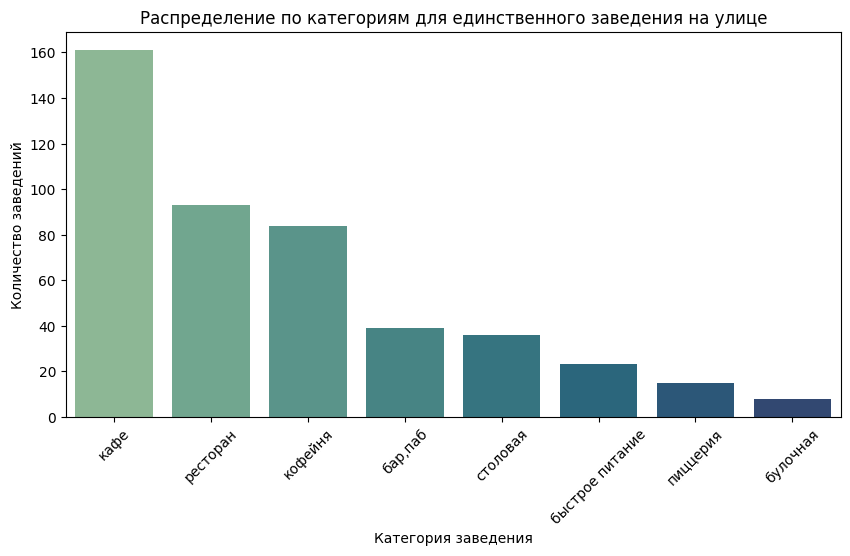

In [84]:
f, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(data=categories_one_object, x='category', y='count', palette="crest")

ax.set_xlabel('Категория заведения')
ax.set_ylabel('Количество заведений')
ax.set_title('Распределение по категориям для единственного заведения на улице')
plt.xticks(rotation=45)

plt.show()

Самая распространенная категория заведений на улицах с единственным объектом общественного питания - это кафе. Ресторанов и кофеен примерно в два раза меньше.

Теперь изучим распределение по районам. Сгруппируем данные по району и категории, чтобы посчитать количество единственных на улице заведений в каждой категории по районам:

In [85]:
district_one_object_cat = data_one_object.groupby(['district', 'category']) \
                                     .agg(count=('name', 'count')) \
                                     .sort_values(by='count', ascending=False) \
                                     .reset_index() 

Добавим в датафрейм district_one_rest_cat столбец total_count с общим количеством единственных на улице заведений по районам:

In [86]:
for d in district_one_object_cat['district'].unique():
    district_one_object_cat.loc[(district_one_object_cat['district'] == d), 'total_count']  = \
    district_one_object_cat.loc[(district_one_object_cat['district'] == d), 'count'].sum()

Визуализируем распределение количества единственных на улице заведений по районам столбчатой диаграммой:

In [87]:
fig = px.bar(district_one_object_cat.sort_values(by='total_count', ascending=False), 
             x='district', 
             y='count', 
             color='category',
            )
fig.update_layout(title='Количество единственных на улице заведений по районам',
                  xaxis_title='Район',
                  yaxis_title='Количество заведений')
fig.show()


Большая часть единственных на улице заведений общественного питания расположены в Центральном административном округе.

Определим медианный чек единственных на улице заведений общественного питания и сравним его с медианным чеком всех остальных заведений:

In [88]:
print('Медианный чек единственных на улице заведений равен', data_one_object.query('middle_avg_bill != 0')['middle_avg_bill'].median())

Медианный чек единственных на улице заведений равен 625.0


In [89]:
print('Медианный чек всх остальных заведений равен', data.query('street not in @one_object_streets and middle_avg_bill != 0')['middle_avg_bill'].median())

Медианный чек всх остальных заведений равен 750.0


Определим медианный рейтинг единственных на улице заведений общественного питания и сравним его с медианным рейтингом всех остальных заведений:

In [90]:
print('Медианный рейтинг единственных на улице заведений составляет', data_one_object['rating'].median())

Медианный рейтинг единственных на улице заведений составляет 4.3


In [91]:
print('Медианный рейтинг всех остальных заведений составляет', data.query('street not in @one_object_streets')['rating'].median())

Медианный рейтинг всех остальных заведений составляет 4.3


Определим медианное количество посадочных мест единственных на улице заведений общественного питания и сравним его с медианным количеством посадочных мест всех остальных заведений:

In [92]:
print('Медианное количество посадочных мест единственных на улице заведений', data_one_object.query('seats != -1')['seats'].median())

Медианное количество посадочных мест единственных на улице заведений 45.0


In [93]:
print('Медианное количество посадочных мест всех остальных заведений', data.query('street not in @one_object_streets and seats != -1')['seats'].median())

Медианное количество посадочных мест всех остальных заведений 75.0


Выяснили, что единственные на улице заведения имеют такой же рейтинг, как и все остальные, но отличаются более низкими ценами и меньшим количеством посадочных мест.

### Изучение заведений по средним чекам

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Изучим, как удалённость от центра влияет на цены в заведениях?

Посчитаем медиану столбца middle_avg_bill со средней стоимостью заказа в рублях для каждого района:

In [94]:
district_median_middle_avg_bill = data.query('middle_avg_bill != 0') \
                                      .groupby('district') \
                                      .agg(median_middle_avg_bill=('middle_avg_bill', 'median')) \
                                      .sort_values(by='median_middle_avg_bill', ascending=False) \
                                      .reset_index()

In [95]:
district_median_middle_avg_bill

,district,median_middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Используем медиану среднего чека в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района:

In [96]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_median_middle_avg_bill,
    columns=['district', 'median_middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие средние чеки - в заведениях общественного питания Центрально и Западного административных округов (1000 руб.), самый низкий - в Юго-Восточном административном округе (450 руб.). В остальных округах средние чеки составляют от 500 до 700 руб. Таким образом, удалённость от центра влияет на величину среднего чека не во всех округах Москвы.

### Часы работы заведений

Рассмотрим соотношение заведений, работающих круглосуточно и некруглосуточно:

In [97]:
hours_category = ['круглосуточные', 'некруглосуточные']
values = [len(data.query('is_24_7')), len(data.query('~is_24_7'))]

Для визуализации постоим круговую диаграмму:

In [98]:
fig = go.Figure(data=[go.Pie(labels=hours_category, values=values)])
fig.update_layout(title='Распределение заведений общественного питания по часам работы', 
                  width=800, 
                  height=500,
                  annotations=[dict(x=1.21, 
                                    y=1.05,
                                    text='Время работы',
                                    showarrow=False)])
fig.show() 

Доля заведений в Москве, которые работают круглосуточно - менее 9%

Посмотрим на распределение по категориям:

In [99]:
work_time = data.groupby(['category', 'is_24_7'], as_index = False) \
                .agg(count=('category', 'count')) 

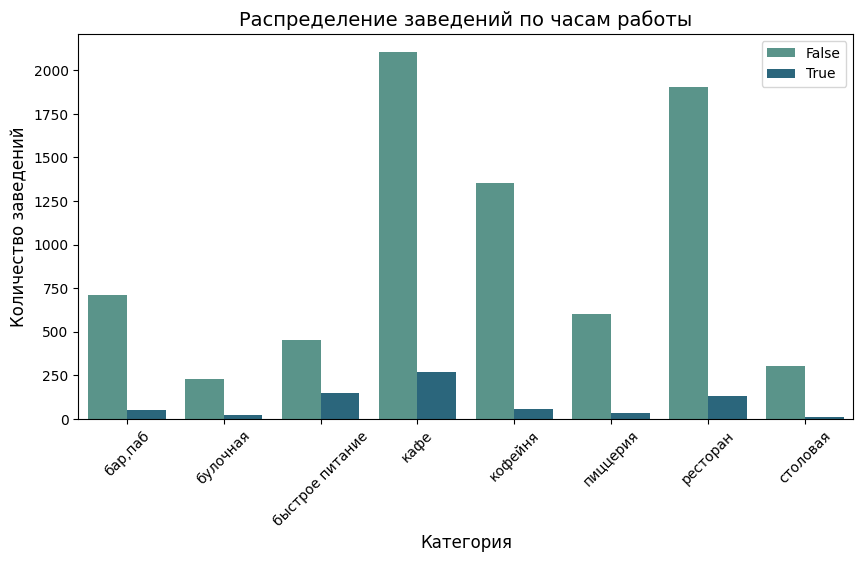

In [100]:
# назначаем размер графика
plt.figure(figsize=(10, 5))
# строим столбчатый график средствами seaborn
sns.barplot(x='category', 
            y='count', 
            data=work_time, 
            hue='is_24_7', 
            palette = 'crest')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение заведений по часам работы', fontsize=14)
plt.xlabel('Категория', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=10)
# отображаем график на экране
plt.show()

По общему количеству круглосуточных заведений в Москве больше всего в категории кафе, заведения быстрого питания и рестораны. Надо так же отметить, что в категории заведения быстрого питания доля круглосуточных заведений самая большая от общего количества в категории.

Распределение круглосуточных заведений общественного питания на карте Москвы:

In [102]:
district_object_24_7 = data.query('is_24_7') \
                          .groupby('district') \
                          .agg(count=('name', 'count')) \
                          .sort_values(by='count', ascending=False) \
                          .reset_index()

In [103]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_object_24_7,
    columns=['district', 'count'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Распределение круглосуточных заведений по районам',
).add_to(m)

# выводим карту
m

Больше всего круглосуточных заведений, как и ожидаемо, в Центральном округе. Также довольно много их на востоке Москвы. Меньше всего их в Северо-Западном округе.

# Обобщенные выводы:

Перед исследованием была произведена предобработка данных, в ходе которой выяснили следующее:

1. Проверка на дубликаты показала, что:
- Явных дубликатов не обнаружено
- Явных дубликатов по сочетанию названия и адреса не обнаружено
- Неявных дубликатов в категориях заведения не выявлено
- Неявных дубликатов в названиях районов не выявлено
- По названияв выявили, что большая часть из этих заведний - сетевые. Но так же встречаются заведения с общими названиями "Кафе","Шаурма", "Ресторан" и "Столовая". Проверили, есть ли среди заведений с такими названиями сетевые и выяснили, что нет.
- Проверили данные на неявные дубликаты по названиям и выявили 16 неявных дубликатов. У этих заведений различаются написания названий, например 'Чебуреки Манты' или 'Чебуреки и манты' , но совпадают категории и адреса. 
- Удалили строки, которые по всей видимости являются дубликатами.
- Удалили 16 дубликатов. Теперь в датасете имеем 8390 заведений.

2. Обработка пропусков в данных выявила:
- наличие множественных пропусков. К сожалению, обработать большую часть их них невозможно из-за отсутствия статистики. Заполнять пропуски средними или медианными значениями некорректно, так как даже для сетевых заведений данные в разных районах могут значительно отличаться. Чтобы избежать искажения данных, оставили пропуски как есть.

3. Добавили новые столбцы:
- столбец 'street' с названиями улиц из столбца с адресом
- столбец 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

Результаты проведенного анализа данных

1. Выводы из исследования данных по категориям заведений:

- По количеству заведений лидируют кафе с численностью 2371 (28,3%), немного меньше ресторан - 2040 (24,3%). На третьем месте расположены кофейни - 1411 (16,8%). Меньше всего заведений в категориях столовая - 315 (3,15%) и булочная - 255 (3,04%).

- Кафе и рестораны составляют больше половины от всех заведений. Кофейни, бары/пабы и пиццерии составляют больше трети от общего числа заведений. Оставшаяся доля (чуть меньше 14%) приходится на булочные, столовые и заведения быстрого питания.

2. Выводы из исследования количества посадочных мест по категориям заведений:

- Наибольшее среднее количество посадочных мест - в ресторанах (86), барах и пабах (82,5) и кофейнях (80). Меньше посадочных мест в столовых (75), в заведениях быстрого питания (67). Меньше всего посадочных мест в кафе (60), в пиццериях (55) и в булочных (50).

3. Выводы из исследования соотношения сетевых и несетевых заведений:

- большая часть заведений общественного питаБния в Москве - несетевые (62 %), сетевых заведений 38 %.

4. Выводы из исследования, какие категории заведений чаще являются сетевыми:

- самая большая доля сетевых объектов среди булочных (62%). Затем идут пиццерии (52%), кофейни (51%) и фаст-фуд (39%).

5. Определили топ-15 заведений в Москве:

- самая популярная сеть в Москве, причем с большим отрывом от конкурентов - это Шоколадница (категория "кофейня"), она имеет 120 заведений. Далее расположены Домино'с Пицца (категория "пиццерия") - 76 заведений и Додо Пицца (категория "пиццерия") - 74 заведения. Все три сети расчитаны на клиента среднего уровня, где Шоколадница занимает более высокий ценовой сегмент, а Домино'с Пицца и Додо Пицца - более дешевый, и много работают с доставкой и на вынос.

6. Изучили, какие административные районы Москвы присутствуют в датасете и отобразили общее количество заведений и количество заведений каждой категории по районам:

- представлены следующие административные округа: 'Центральный административный округ','Западный административный округ','Северо-Западный административный округ','Юго-Западный административный округ','Северо-Восточный административный округ', 'Южный административный округ','Северный административный округ','Восточный административный округ','Юго-Восточный административный округ'
 - по количеству заведений однозначно лидирует Центральный административный округ с общим количеством заведений 2241, обходя почти в два с половиной раза соседей по рейтингу. Северный, Северо-Восточный и Южный округа занимают второе, третье и четвертое места и имеют примерно одинаковое количество заведений - чуть менее 900. Меньше всего заведений в Северо-Западном округе, всего 409.
 
7. Визуализировали распределение средних рейтингов по категориям заведений и узнали как сильно различаются усреднённые рейтинги в разных типах общепита:

- самую высокую оценку посетителей (4,39) получают заведения в категории "Бар, паб". Вероятно, такая благосклонность связана с приемом алкоголя в этих заведениях. Средний рейтинг имеют пиццерии(4,3), рестораны(4,29), кофейни(4,28) и булочные(4,27). Самые низкие рейтинги у столовых(4,21), кафе(4,12) и заведений быстрого питания(4,05).

8. Построили фоновую картограмма (хороплет) со средним рейтингом заведений каждого района и увидели, что: 

- самый высокий рейтинг у заведений в Центральном административном округе - 4.38. Самый низкий в Юго-Восточном административном округе - 4.1.

9. Отобразили все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

10. Нашли топ-15 улиц по количеству заведений и построили график распределения количества заведений и их категорий по этим улицам. График показал, что:

- по количеству заведений лидирует проспект Мира. По категориям здесь преобладают кафе, рестораны и кофейни. Меньше всего столовых и булочных. Следом за ним идет Профсоюзная, ситуация с категориями там очень похожа. Меньше всего заведений на Пятницкой улице. Среди популярных категорий также рестораны, кафе и кофейни.
Следует отметить, что по этим данным нельзя говорить о плотности распределения заведений на какой-либо улице. Дело в том, что Проспект Мира и Профсоюзная - это самые длинные по протяженности улицы Москвы. А Пятницкая улица - гораздо короче. И хотя на Пятницкой почти в каждом доме есть кафе и рестораны, по общему количеству она не может соперничать с улицами из верхних позиций в топ 15.

11. Нашли улицы, на которых находится только один объект общепита, изучили их подробнее и выяснили:

- самая распространенная категория заведений на улицах с единственным объектом общественного питания - это кафе. Ресторанов и кофеен примерно в два раза меньше.
- большая часть единственных на улице заведений общественного питания расположены в Центральном административном округе.
- единственные на улице заведения имеют такой же рейтинг, как и все остальные, но отличаются более низкими ценами и меньшим количеством посадочных мест.

12. Изучили заведения по средним чекам:

- самые высокие средние чеки - в заведениях общественного питания Центрально и Западного административных округов (1000 руб.), самый низкий - в Юго-Восточном административном округе (450 руб.). В остальных округах средние чеки составляют от 500 до 700 руб. Таким образом, удалённость от центра влияет на величину среднего чека не во всех округах Москвы.

13. Изучили заведения по часам работы:

- доля заведений в Москве, которые работают круглосуточно - менее 9%
- по общему количеству круглосуточных заведений в Москве больше всего в категории кафе, заведения быстрого питания и рестораны. Надо так же отметить, что в категории заведения быстрого питания доля круглосуточных заведений самая большая от общего количества в категории.
- больше всего круглосуточных заведений, как и ожидаемо, в Центральном округе. Также довольно много их на востоке Москвы. Меньше всего их в Северо-Западном округе.

## Исследование для открытия кофейни

### Сколько всего кофеен в датасете?

In [104]:
data_cofe = data.query('category == "кофейня"')

In [105]:
print('В датасете всего', len(data_cofe), 'кофеен.')

В датасете всего 1411 кофеен.


In [106]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_cofe.apply(create_clusters, axis=1)

# выводим карту
m3

### В каких районах их больше всего, каковы особенности их расположения?

In [107]:
cofe_district = data_cofe.groupby('district') \
                                    .agg(count=('name', 'count')) \
                                    .sort_values(by='count', ascending=False) \
                                    .reset_index()

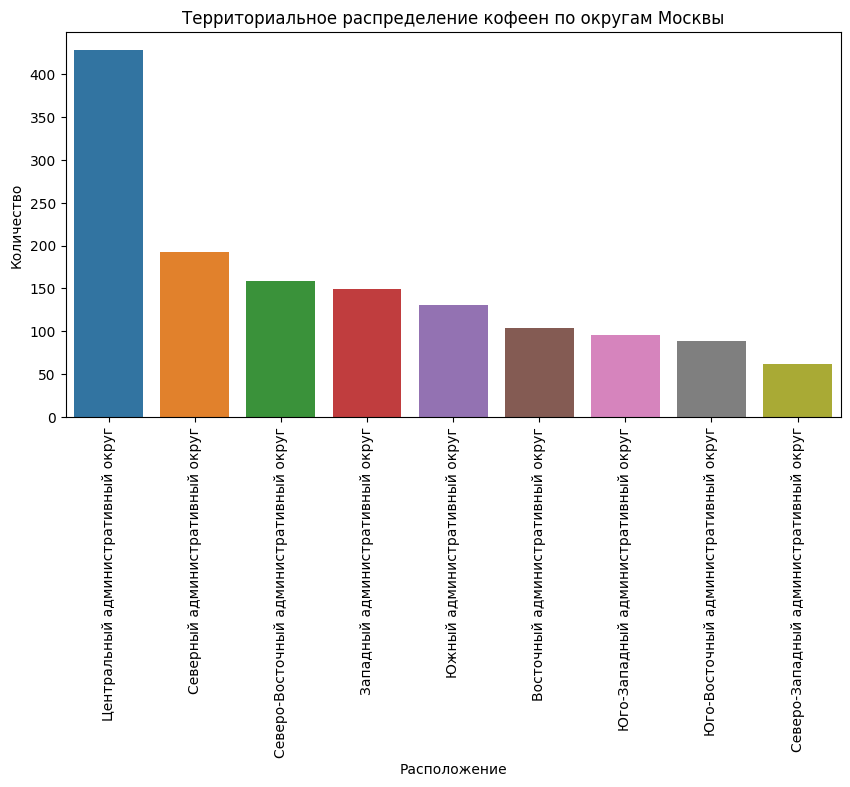

In [109]:
f, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(data=cofe_district, x='district', y='count')

ax.set_xlabel('Расположение')
ax.set_ylabel('Количество')
ax.set_title('Территориальное распределение кофеен по округам Москвы')

plt.xticks(rotation=90)
plt.show()

In [110]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofe_district,
    columns=['district', 'count'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# выводим карту
m

Большая часть кофеен находится в Центральном округе. На втором месте - Северный административный округ. На третьем - Северо-Восточный, Западный и Южный округа. Меньше всего кофеен в Восточном, Юго-Западном, Юго_Восточном и Северо-Западном округах.

### Есть ли круглосуточные кофейни?

In [111]:
print('{:.1%}'.format(len(data_cofe.query('hours == "ежедневно, круглосуточно"')) / len(data_cofe)), 'кофеен работают круглосуточно.')

4.2% кофеен работают круглосуточно.


###  Какие у кофеен рейтинги? Как они распределяются по районам?

In [112]:
cofe_rating = data_cofe.groupby('district') \
                                         .agg(rating=('rating', 'mean')) \
                                         .sort_values(by='rating', ascending=False) \
                                         .reset_index()

In [113]:
fig = px.bar(cofe_rating,
             x='rating', 
             y='district',
             text='rating', 
             color='district'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов кофеен по районам Москвы',
                   xaxis_title='Рейтинг',
                   yaxis_title='Расположение кофейни')
# меняем диапазон значений рейтинга на графике
fig.update_xaxes(range=[4, 4.5])
# выводим график
fig.show()


Медианные рейтинги кофеен в зависимости от территориального расположения практически не отличаются. Для всей Москвы медианный рейтинг кофеен составляет 4,3. Исключением является лишь Западный округ, где рейтинг немного ниже, и составляет 4,2.

### Стоимость чашки капучино

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [114]:
cofe_cup = data_cofe.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(cofe_cup)
print('Средняя стоимость чашки кофе в Москве:', cofe_cup['middle_coffee_cup'].mean())

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.32


In [115]:
# создаём карту Москвы
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofe_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний цена чашки кофе по районам',
).add_to(m6)

# выводим карту
m6

Самая дорогая средняя цена чашки капучино в Центральном, Западном и Юго-Западном округе (цена в диапазоне 183-190 рублей). Самая дешевая средняя цена чашки капучино в Юго-Восточном округе, где она составляет 151 рубль.

Вывод - рекомендация для открытия нового заведения для инвесторов из фонда «Shut Up and Take My Money».

1. Рекомендуемый тип заведения - кафе. Это самый популярный вид объекта общественного питания в Москве как среди всех заведений, так и среди сетевых.

2. Несетевых заведений в Москве в 4.2 раза больше, чем сетевых, так что не стоит бояться конкуренции крупных игроков рынка. При правильной организации бизнеса наше несетевое кафе будет способно выдержать конкуренцию  с сетевыми заведениями того же типа.

3. Выбор локации в популярных районах Москвы - это центральные районы, а именно округа Тверской, Пресненский, Басманный, Даниловский или Замоскворечье. Надо выбирать место, куда удобно добраться пешком от остановок общественного транспорта, из прогулочных мест по историческому центру и набережной Москвы-реки. А эти районы прекрасно удовлетворяют этим условиям. Если получится арендовать помещение на одной из топ-10 улиц по количеству заведений, в центральных районах этих улиц, то тогда еще будет решен вопрос с автомобильной доступностью

4. кафе должно быть с небольшим количеством посадочных мест, желательно до 40. В таких небольших кафе дешевле и проще создавать необычные интерьеры, дешевле аренда из-за небольшой площади, немного персонала, что снижает расходы. Так как популярны кафе именно с небольшим количеством мест среди их создателей, то видимо небольшие камерные кафе популярны и среди посетителей - в них уютней и комфортнее, чем в больших заведениях.

5. При правильном подходе к ведению бизнеса в будущем кафе может развиться до сети, это можно заложить в бизнес-план.

[Презентация](https://www.dropbox.com/s/e9pzhxf6wtcsm83/%D0%9F%D1%80%D0%B5%D0%B7%D0%B5%D0%BD%D1%82%D0%B0%D1%86%D0%B8%D1%8F%20%D0%B8%D1%81%D1%81%D0%BB%D0%B5%D0%B4%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D1%8F%20%D0%B7%D0%B0%D0%B2%D0%B5%D0%B4%D0%B5%D0%BD%D0%B8%D0%B9%20%D0%BE%D0%B1%D1%89%D0%B5%D1%81%D1%82%D0%B2%D0%B5%D0%BD%D0%BD%D0%BE%D0%B3%D0%BE%20%D0%BF%D0%B8%D1%82%D0%B0%D0%BD%D0%B8%D1%8F%20%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D1%8B.pdf?dl=0)